In [ ]:
import pandas as pd
import numpy as np
pd.set_option("display.max_columns", None)
movies=pd.read_csv('movies.csv')
movies.head(3)

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance


In [ ]:
movies.loc[movies.title.str.contains("Pocahontas")]

,movieId,title,genres
44,48,Pocahontas (1995),Animation|Children|Drama|Musical|Romance
7910,95193,Pocahontas II: Journey to a New World (1998),Adventure|Animation|Children


In [ ]:
movies.shape

(9742, 3)

In [ ]:
movies.isnull().sum()

movieId    0
title      0
genres     0
dtype: int64

In [ ]:
ratings=pd.read_csv('ratings.csv')
ratings.tail(3)

,userId,movieId,rating,timestamp
100833,610,168250,5.0,1494273047
100834,610,168252,5.0,1493846352
100835,610,170875,3.0,1493846415


In [ ]:
ratings.rating.value_counts()

4.0    26818
3.0    20047
5.0    13211
3.5    13136
4.5     8551
2.0     7551
2.5     5550
1.0     2811
1.5     1791
0.5     1370
Name: rating, dtype: int64

In [ ]:
ratings.shape

(100836, 4)

In [ ]:
ratings.isnull().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

In [ ]:
tags=pd.read_csv('tags.csv')
tags.head(3)

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994
1,2,60756,Highly quotable,1445714996
2,2,60756,will ferrell,1445714992


In [ ]:
tags.shape

(3683, 4)

In [ ]:
tags.isnull().sum()

userId       0
movieId      0
tag          0
timestamp    0
dtype: int64

In [ ]:
links=pd.read_csv('links.csv')
links.head(3)

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0


In [ ]:
links.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9742 entries, 0 to 9741
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  9742 non-null   int64  
 1   imdbId   9742 non-null   int64  
 2   tmdbId   9734 non-null   float64
dtypes: float64(1), int64(2)
memory usage: 228.5 KB


In [ ]:
links.isnull().sum()

movieId    0
imdbId     0
tmdbId     8
dtype: int64

###  Popularity/Quality based recommmender system

In [ ]:
ratings_pop= pd.DataFrame(ratings.groupby('movieId')['rating'].mean())
ratings_pop.sort_values('rating', ascending=False).head()

,rating
movieId,
88448,5.0
100556,5.0
143031,5.0
143511,5.0
143559,5.0


In [ ]:
ratings.query("movieId==88448")

,userId,movieId,rating,timestamp
77875,483,88448,5.0,1315437602


In [ ]:
ratings_pop['rating_count'] = ratings.groupby('movieId')['rating'].count()
ratings_pop.sort_values("rating_count", ascending=False).head(10)

,rating,rating_count
movieId,,
356,4.164134,329
318,4.429022,317
296,4.197068,307
593,4.161290,279
2571,4.192446,278
260,4.231076,251
480,3.750000,238
110,4.031646,237
589,3.970982,224


In [ ]:
result= ratings_pop.merge(movies, how="inner", on="movieId")
result

,movieId,rating,rating_count,title,genres
0,1,3.920930,215,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,3.431818,110,Jumanji (1995),Adventure|Children|Fantasy
2,3,3.259615,52,Grumpier Old Men (1995),Comedy|Romance
3,4,2.357143,7,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,3.071429,49,Father of the Bride Part II (1995),Comedy
...,...,...,...,...,...
9719,193581,4.000000,1,Black Butler: Book of the Atlantic (2017),Action|Animation|Comedy|Fantasy
9720,193583,3.500000,1,No Game No Life: Zero (2017),Animation|Comedy|Fantasy
9721,193585,3.500000,1,Flint (2017),Drama
9722,193587,3.500000,1,Bungo Stray Dogs: Dead Apple (2018),Action|Animation


In [ ]:
top_10=result.sort_values("rating_count", ascending=False).head(10)
top_10=top_10[['movieId','title','genres','rating','rating_count']]
top_10

,movieId,title,genres,rating,rating_count
314,356,Forrest Gump (1994),Comedy|Drama|Romance|War,4.164134,329
277,318,"Shawshank Redemption, The (1994)",Crime|Drama,4.429022,317
257,296,Pulp Fiction (1994),Comedy|Crime|Drama|Thriller,4.197068,307
510,593,"Silence of the Lambs, The (1991)",Crime|Horror|Thriller,4.161290,279
1938,2571,"Matrix, The (1999)",Action|Sci-Fi|Thriller,4.192446,278
224,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Sci-Fi,4.231076,251
418,480,Jurassic Park (1993),Action|Adventure|Sci-Fi|Thriller,3.750000,238
97,110,Braveheart (1995),Action|Drama|War,4.031646,237
507,589,Terminator 2: Judgment Day (1991),Action|Sci-Fi,3.970982,224
461,527,Schindler's List (1993),Drama|War,4.225000,220


In [ ]:
import pickle
pickle.dump(top_10, open(file='Popular_movies.sav', mode='wb'))

### WBSflix_item_based_recommender_system

#### Preparing Data For Correlation

In [ ]:
movies_crosstab = pd.pivot_table(data=ratings, values='rating', index='userId', columns='movieId')
movies_crosstab.head(3)

movieId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,34,36,38,39,40,41,42,43,44,45,46,47,48,49,50,52,53,54,55,57,58,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,85,86,87,88,89,92,93,94,95,96,97,99,100,101,102,103,104,105,106,107,108,110,111,112,113,116,117,118,119,121,122,123,125,126,128,129,132,135,137,140,141,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,168,169,170,171,172,173,174,175,176,177,178,179,180,181,183,184,185,186,187,188,189,190,191,193,194,195,196,198,199,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,222,223,224,225,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,265,266,267,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,287,288,289,290,291,292,293,294,295,296,298,299,300,301,302,303,304,305,306,307,308,310,311,312,313,314,315,316,317,318,319,320,321,322,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,393,405,406,407,408,409,410,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,440,441,442,444,445,446,448,449,450,451,452,453,454,455,456,457,458,459,460,461,464,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,484,485,486,487,488,489,490,491,492,493,494,495,496,497,499,500,501,502,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,526,527,528,529,531,532,533,534,535,536,537,538,539,540,541,542,543,544,546,547,548,549,550,551,552,553,555,556,558,562,563,564,567,568,569,573,574,575,577,579,580,581,583,585,586,587,588,589,590,592,593,594,595,596,597,599,600,602,605,606,608,609,610,611,612,613,615,616,617,618,619,626,627,628,631,632,633,634,635,636,637,638,639,640,645,647,648,649,650,653,656,661,662,663,665,667,668,670,671,673,674,678,679,680,685,688,691,692,694,695,697,698,700,703,704,706,707,708,709,710,711,714,715,718,719,720,722,724,725,726,728,731,733,735,736,737,741,742,743,745,747,748,750,757,759,760,761,762,764,765,766,773,775,778,779,780,781,782,783,784,785,786,788,790,791,795,798,799,800,801,802,803,804,805,806,808,809,810,813,818,823,824,828,829,830,832,833,835,836,837,838,839,840,841,842,848,849,851,852,858,861,866,867,869,870,875,876,879,880,881,882,885,886,888,889,891,892,893,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,926,927,928,929,930,931,932,933,934,935,936,937,938,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,959,961,963,965,968,969,970,971,973,976,979,981,982,984,986,987,988,990,991,993,994,996,998,999,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025,1027,1028,1029,1030,1031,1032,1033,1034,1035,1036,1037,1040,1041,1042,1043,1046,1047,1049,1050,1051,1053,1054,1055,1056,1057,1059,1060,1061,1064,1066,1068,1073,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1099,1100,1101,1103,1104,1105,1107,1111,1112,1114,1116,1117,1119,1120,1121,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1135,1136,1137,1140,1144,1147,1148,1150,1151,1156,1161,1162,1163,1167,1170,1171,1172,1173,1175,1176,1177,1178,1179,1180,1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,1196,1197,1198,1199,1200,1201,1202,1203,1204,1206,1207,1208,1209,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,1220,1221,1222,1223,1224,1225,1226,1227,1228,1230,1231,1232,1233,1234,1235,1236,1237,1238,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,

In [ ]:
top_popular_movieID = 356

In [ ]:
Forest_gump_ratings = movies_crosstab[top_popular_movieID]
Forest_gump_ratings[Forest_gump_ratings>=0]

userId
1      4.0
6      5.0
7      5.0
8      3.0
10     3.5
      ... 
605    3.0
606    4.0
608    3.0
609    4.0
610    3.0
Name: 356, Length: 329, dtype: float64

### Evaluating Similarity Based on Correlation

In [ ]:
similar_to_Forest_gump = movies_crosstab.corrwith(Forest_gump_ratings)
similar_to_Forest_gump

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2683: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


movieId
1         0.303465
2         0.367247
3         0.534682
4         0.388514
5         0.349541
            ...   
193581         NaN
193583         NaN
193585         NaN
193587         NaN
193609         NaN
Length: 9724, dtype: float64

In [ ]:
corr_Forest_gump = pd.DataFrame(similar_to_Forest_gump, columns=['PearsonR'])
corr_Forest_gump.dropna(inplace=True)
corr_Forest_gump.head(3)

,PearsonR
movieId,
1,0.303465
2,0.367247
3,0.534682


In [ ]:
rating = pd.DataFrame(ratings.groupby('movieId')['rating'].mean())
rating['rating_count'] = ratings.groupby('movieId')['rating'].count()
rating

,rating,rating_count
movieId,,
1,3.920930,215
2,3.431818,110
3,3.259615,52
4,2.357143,7
5,3.071429,49
...,...,...
193581,4.000000,1
193583,3.500000,1
193585,3.500000,1


In [ ]:
Forest_gump_corr_summary = corr_Forest_gump.join(rating['rating_count'])
Forest_gump_corr_summary.drop(top_popular_movieID, inplace=True) # drop Tortas Locas itself
Forest_gump_corr_summary

,PearsonR,rating_count
movieId,,
1,0.303465,215
2,0.367247,110
3,0.534682,52
4,0.388514,7
5,0.349541,49
...,...,...
185585,-1.000000,2
187541,1.000000,4
187593,-0.203519,12


In [ ]:
top10 = Forest_gump_corr_summary[Forest_gump_corr_summary['rating_count']>=10].sort_values('PearsonR', ascending=False).head(10)
top10

,PearsonR,rating_count
movieId,,
1295,0.932958,11
6793,0.885253,11
328,0.881682,10
4954,0.865633,11
911,0.850591,13
55721,0.799415,10
195,0.786428,10
181,0.785661,17
80906,0.782601,12


In [ ]:
top10 = top10.merge(movies, left_index=True, right_on="movieId")
top10

,PearsonR,rating_count,movieId,title,genres
993,0.932958,11,1295,"Unbearable Lightness of Being, The (1988)",Drama
4573,0.885253,11,6793,Beethoven (1992),Children|Comedy|Drama
286,0.881682,10,328,Tales from the Crypt Presents: Demon Knight (1...,Horror|Thriller
3607,0.865633,11,4954,Ocean's Eleven (a.k.a. Ocean's 11) (1960),Comedy|Crime
693,0.850591,13,911,Charade (1963),Comedy|Crime|Mystery|Romance|Thriller
6607,0.799415,10,55721,Elite Squad (Tropa de Elite) (2007),Action|Crime|Drama|Thriller
165,0.786428,10,195,Something to Talk About (1995),Comedy|Drama|Romance
153,0.785661,17,181,Mighty Morphin Power Rangers: The Movie (1995),Action|Children
7436,0.782601,12,80906,Inside Job (2010),Documentary
9193,0.776636,10,150548,Sherlock: The Abominable Bride (2016),Action|Crime|Drama|Mystery|Thriller


In [ ]:
# your code here
def top_n_rest(rest_id,n):
    rest_ratings = movies_crosstab[rest_id]
    similar_to_rest = movies_crosstab.corrwith(rest_ratings)
    corr_rest = pd.DataFrame(similar_to_rest, columns=['PearsonR'])
    corr_rest.dropna(inplace=True)
    rest_corr_summary = corr_rest.join(rating['rating_count'])
    rest_corr_summary.drop(rest_id, inplace=True) # drop the inputed restaurant itself
    top10 = rest_corr_summary[rest_corr_summary['rating_count']>=10].sort_values('PearsonR', ascending=False).head(5)
    top10 = top10.merge(movies, left_index=True, right_on="movieId")
    return top10

In [ ]:
result=top_n_rest(48,5)

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2683: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


In [ ]:
import pickle
pickle.dump(result, open(file='Item_movies.sav', mode='wb'))

### WBSflix_item_based_recommender_system

### 1. Create the big users-items table

In [ ]:
users_items = pd.pivot_table(data=ratings, values='rating', index='userId', columns='movieId')
users_items.head(3)

movieId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,34,36,38,39,40,41,42,43,44,45,46,47,48,49,50,52,53,54,55,57,58,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,85,86,87,88,89,92,93,94,95,96,97,99,100,101,102,103,104,105,106,107,108,110,111,112,113,116,117,118,119,121,122,123,125,126,128,129,132,135,137,140,141,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,168,169,170,171,172,173,174,175,176,177,178,179,180,181,183,184,185,186,187,188,189,190,191,193,194,195,196,198,199,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,222,223,224,225,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,265,266,267,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,287,288,289,290,291,292,293,294,295,296,298,299,300,301,302,303,304,305,306,307,308,310,311,312,313,314,315,316,317,318,319,320,321,322,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,393,405,406,407,408,409,410,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,440,441,442,444,445,446,448,449,450,451,452,453,454,455,456,457,458,459,460,461,464,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,484,485,486,487,488,489,490,491,492,493,494,495,496,497,499,500,501,502,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,526,527,528,529,531,532,533,534,535,536,537,538,539,540,541,542,543,544,546,547,548,549,550,551,552,553,555,556,558,562,563,564,567,568,569,573,574,575,577,579,580,581,583,585,586,587,588,589,590,592,593,594,595,596,597,599,600,602,605,606,608,609,610,611,612,613,615,616,617,618,619,626,627,628,631,632,633,634,635,636,637,638,639,640,645,647,648,649,650,653,656,661,662,663,665,667,668,670,671,673,674,678,679,680,685,688,691,692,694,695,697,698,700,703,704,706,707,708,709,710,711,714,715,718,719,720,722,724,725,726,728,731,733,735,736,737,741,742,743,745,747,748,750,757,759,760,761,762,764,765,766,773,775,778,779,780,781,782,783,784,785,786,788,790,791,795,798,799,800,801,802,803,804,805,806,808,809,810,813,818,823,824,828,829,830,832,833,835,836,837,838,839,840,841,842,848,849,851,852,858,861,866,867,869,870,875,876,879,880,881,882,885,886,888,889,891,892,893,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,926,927,928,929,930,931,932,933,934,935,936,937,938,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,959,961,963,965,968,969,970,971,973,976,979,981,982,984,986,987,988,990,991,993,994,996,998,999,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025,1027,1028,1029,1030,1031,1032,1033,1034,1035,1036,1037,1040,1041,1042,1043,1046,1047,1049,1050,1051,1053,1054,1055,1056,1057,1059,1060,1061,1064,1066,1068,1073,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1099,1100,1101,1103,1104,1105,1107,1111,1112,1114,1116,1117,1119,1120,1121,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1135,1136,1137,1140,1144,1147,1148,1150,1151,1156,1161,1162,1163,1167,1170,1171,1172,1173,1175,1176,1177,1178,1179,1180,1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,1196,1197,1198,1199,1200,1201,1202,1203,1204,1206,1207,1208,1209,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,1220,1221,1222,1223,1224,1225,1226,1227,1228,1230,1231,1232,1233,1234,1235,1236,1237,1238,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,

### 2. Replace NaNs with zeros

In [ ]:
users_items.fillna(0, inplace=True)
users_items.head()

movieId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,34,36,38,39,40,41,42,43,44,45,46,47,48,49,50,52,53,54,55,57,58,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,85,86,87,88,89,92,93,94,95,96,97,99,100,101,102,103,104,105,106,107,108,110,111,112,113,116,117,118,119,121,122,123,125,126,128,129,132,135,137,140,141,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,168,169,170,171,172,173,174,175,176,177,178,179,180,181,183,184,185,186,187,188,189,190,191,193,194,195,196,198,199,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,222,223,224,225,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,265,266,267,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,287,288,289,290,291,292,293,294,295,296,298,299,300,301,302,303,304,305,306,307,308,310,311,312,313,314,315,316,317,318,319,320,321,322,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,393,405,406,407,408,409,410,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,440,441,442,444,445,446,448,449,450,451,452,453,454,455,456,457,458,459,460,461,464,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,484,485,486,487,488,489,490,491,492,493,494,495,496,497,499,500,501,502,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,526,527,528,529,531,532,533,534,535,536,537,538,539,540,541,542,543,544,546,547,548,549,550,551,552,553,555,556,558,562,563,564,567,568,569,573,574,575,577,579,580,581,583,585,586,587,588,589,590,592,593,594,595,596,597,599,600,602,605,606,608,609,610,611,612,613,615,616,617,618,619,626,627,628,631,632,633,634,635,636,637,638,639,640,645,647,648,649,650,653,656,661,662,663,665,667,668,670,671,673,674,678,679,680,685,688,691,692,694,695,697,698,700,703,704,706,707,708,709,710,711,714,715,718,719,720,722,724,725,726,728,731,733,735,736,737,741,742,743,745,747,748,750,757,759,760,761,762,764,765,766,773,775,778,779,780,781,782,783,784,785,786,788,790,791,795,798,799,800,801,802,803,804,805,806,808,809,810,813,818,823,824,828,829,830,832,833,835,836,837,838,839,840,841,842,848,849,851,852,858,861,866,867,869,870,875,876,879,880,881,882,885,886,888,889,891,892,893,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,926,927,928,929,930,931,932,933,934,935,936,937,938,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,959,961,963,965,968,969,970,971,973,976,979,981,982,984,986,987,988,990,991,993,994,996,998,999,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025,1027,1028,1029,1030,1031,1032,1033,1034,1035,1036,1037,1040,1041,1042,1043,1046,1047,1049,1050,1051,1053,1054,1055,1056,1057,1059,1060,1061,1064,1066,1068,1073,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1099,1100,1101,1103,1104,1105,1107,1111,1112,1114,1116,1117,1119,1120,1121,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1135,1136,1137,1140,1144,1147,1148,1150,1151,1156,1161,1162,1163,1167,1170,1171,1172,1173,1175,1176,1177,1178,1179,1180,1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,1196,1197,1198,1199,1200,1201,1202,1203,1204,1206,1207,1208,1209,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,1220,1221,1222,1223,1224,1225,1226,1227,1228,1230,1231,1232,1233,1234,1235,1236,1237,1238,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,

### 3. Compute cosine similarities

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

user_similarities = pd.DataFrame(cosine_similarity(users_items),
                                 columns=users_items.index, 
                                 index=users_items.index)
user_similarities.head()

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.027283,0.059720,0.194395,0.129080,0.128152,0.158744,0.136968,0.064263,0.016875,0.132499,0.016458,0.092971,0.113238,0.160689,0.169858,0.264358,0.214868,0.325376,0.160969,0.153162,0.050691,0.106669,0.155193,0.099261,0.105791,0.238933,0.202866,0.145251,0.099781,0.164454,0.146211,0.151945,0.083544,0.074508,0.071673,0.144736,0.138588,0.329782,0.094755,0.109053,0.255660,0.122498,0.110829,0.327922,0.109975,0.063193,0.098072,0.100929,0.106080,0.126699,0.048781,0.06284,0.130632,0.063314,0.134110,0.345034,0.157534,0.209374,0.066564,0.115522,0.108215,0.216159,0.315212,0.064604,0.233522,0.119046,0.265359,0.154213,0.078068,0.098955,0.209968,0.049217,0.063063,0.142639,0.182982,0.097955,0.177981,0.216426,0.065308,0.109261,0.216061,0.111356,0.165402,0.016092,0.147391,0.032086,0.071453,0.025576,0.051841,0.334727,0.028767,0.232766,0.110082,0.178069,0.282780,0.086557,0.062187,0.066231,0.147763,0.141447,0.156466,0.211480,0.121173,0.090142,0.019425,0.066894,0.057909,0.151465,0.142933,0.071601,0.167299,0.072532,0.078342,0.225257,0.185708

### 4. Compute the weights

In [ ]:
user_id = 1
weights = (
    user_similarities.query("userId!=@user_id")[user_id] / sum(user_similarities.query("userId!=@user_id")[user_id])
         )
weights.head(6)

userId
2    0.000336
3    0.000736
4    0.002395
5    0.001590
6    0.001579
7    0.001956
Name: 1, dtype: float64

In [ ]:
weights.sum()

1.000000000000001

### 5. Find movies user 1 has not rated

In [ ]:
users_items.loc[user_id,:]==0

movieId
1         False
2          True
3         False
4          True
5          True
          ...  
193581     True
193583     True
193585     True
193587     True
193609     True
Name: 1, Length: 9724, dtype: bool

In [ ]:
# select restaurants that the inputed user has not visited
not_visited_restaurants = users_items.loc[users_items.index!=user_id, users_items.loc[user_id,:]==0]
not_visited_restaurants.T

userId,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610
movieId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0.0,0.0,0.0,0.0,4.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,3.0,3.5,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,5.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,1.5,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,3.5,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.5,0.0,3.5,2.5,0.0,0.0,0.0,3.0,0.0,0.0,0.0,2.5,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,

### 6. Compute the ratings user 1 would give to those unrated movies.

In [ ]:
weighted_averages = pd.DataFrame(not_visited_restaurants.T.dot(weights), columns=["predicted_rating"])
weighted_averages.head()

,predicted_rating
movieId,
2,0.842127
4,0.027652
5,0.275115
7,0.321403
8,0.046876


### 7. Find the top 5 restaurants from the rating predictions

In [ ]:
recommendations = weighted_averages.merge(movies, left_index=True, right_on="movieId")
recommendations.sort_values("predicted_rating", ascending=False).head(5)

,predicted_rating,movieId,title,genres
277,2.654727,318,"Shawshank Redemption, The (1994)",Crime|Drama
507,2.087327,589,Terminator 2: Judgment Day (1991),Action|Sci-Fi
659,1.859548,858,"Godfather, The (1972)",Crime|Drama
2078,1.663564,2762,"Sixth Sense, The (1999)",Drama|Horror|Mystery
3638,1.624820,4993,"Lord of the Rings: The Fellowship of the Ring,...",Adventure|Fantasy


In [ ]:
def top_user_movie(id,n):
  users_items = pd.pivot_table(data=ratings,  values='rating', index='userId', columns='movieId')
  users_items.fillna(0, inplace=True)
  user_id=id
  user_similarities = pd.DataFrame(cosine_similarity(users_items),columns=users_items.index, index=users_items.index)
  weights =(user_similarities.query("userId!=@user_id")[user_id] / sum(user_similarities.query("userId!=@user_id")[user_id]) )
  not_visited_restaurants = users_items.loc[users_items.index!=user_id, users_items.loc[user_id,:]==0]
  weighted_averages = pd.DataFrame(not_visited_restaurants.T.dot(weights), columns=["predicted_rating"])
  recommendations = weighted_averages.merge(movies, left_index=True, right_on="movieId")
  result=recommendations.sort_values("predicted_rating", ascending=False).head(n)
  return result['title']

In [ ]:
top_user_movie(1,5)

277                      Shawshank Redemption, The (1994)
507                     Terminator 2: Judgment Day (1991)
659                                 Godfather, The (1972)
2078                              Sixth Sense, The (1999)
3638    Lord of the Rings: The Fellowship of the Ring,...
Name: title, dtype: object

In [ ]:
def movie_user():
    user_id =int(input())
    result = top_n_rest(user_id, 5)
    print(f"Recommened Movies: {list(result['title'])[0:5]}")

result= movie_user()

1


/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2683: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


Recommened Movies: ['Trainwreck (2015)', 'The Nice Guys (2016)', 'Battleship Potemkin (1925)', 'Avengers: Infinity War - Part I (2018)', 'Predestination (2014)']


In [ ]:
pickle.dump(user_similarities,open(file='user_movie.sav', mode='wb'))

### WBSFLIX Evaluation

### Train - Test split

In [ ]:
import numpy as np
np.nonzero(np.array(users_items))

(array([  0,   0,   0, ..., 609, 609, 609]),
 array([   0,    2,    5, ..., 9444, 9445, 9485]))

In [ ]:
ratings_pos = pd.DataFrame(
    np.nonzero(np.array(users_items)), # find out all the positions different than 0
).T
# ratings_pos.columns = ["row_pos", "column_pos"]

ratings_pos.head()

,0,1
0,0,0
1,0,2
2,0,5
3,0,43
4,0,46


In [ ]:
users_items.iloc[0:1, [0, 2, 5, 43, 46]]

movieId,1,3,6,47,50
userId,,,,,
1,4.0,4.0,4.0,5.0,5.0


In [ ]:
len(ratings_pos)

100836

#### 2nd step: Create the train and test

In [ ]:
# split with train and test
from sklearn.model_selection import train_test_split
train_pos, test_pos = train_test_split(ratings_pos, 
                                       random_state=123, 
                                       test_size=.1)

In [ ]:
train_pos.sort_values([0,1]).head(3)

,0,1
0,0,0
1,0,2
3,0,43


In [ ]:
test_pos.sort_values([0,1]).head(3)

,0,1
2,0,5
43,0,632
54,0,787


In [ ]:
pd.DataFrame(np.zeros(users_items.shape))

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
605   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
606   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
607   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
608   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
609   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

     12    13    14    15    16    17    18    19    20    21    22    23    \
0     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
605   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
606   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
607   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
608   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
609   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

     24    25    26    27    28    29    30    31    32    33    34    35    \
0     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
605   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
606   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
607   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
608   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
609   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

     36    37    38    39    40    41    42    43    44    45    46    47    \
0     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
605   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
606   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
607   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
608   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
609   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

     48    49    50    51    52    53    54    55    56    57    58    59    \
0     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1     0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0

In [ ]:
train_pos.values

array([[ 609, 2978],
       [ 379,  938],
       [ 602,   96],
       ...,
       [ 110, 8140],
       [ 191,  508],
       [ 102, 2102]])

In [ ]:
# create an empty arrays full of 0, with the same shape as the users-items data
train = np.zeros(users_items.shape)

# fill the set with the ratings based on the train positions
for pos in train_pos.values: 
    index = pos[0]
    col = pos[1]
    train[index, col] = users_items.iloc[index, col]

# convert arrays to dataframe
train = pd.DataFrame(train, 
                     columns=users_items.columns, 
                     index=users_items.index)

train.head()

movieId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,34,36,38,39,40,41,42,43,44,45,46,47,48,49,50,52,53,54,55,57,58,60,61,62,63,64,65,66,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,85,86,87,88,89,92,93,94,95,96,97,99,100,101,102,103,104,105,106,107,108,110,111,112,113,116,117,118,119,121,122,123,125,126,128,129,132,135,137,140,141,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,168,169,170,171,172,173,174,175,176,177,178,179,180,181,183,184,185,186,187,188,189,190,191,193,194,195,196,198,199,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,222,223,224,225,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,265,266,267,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,287,288,289,290,291,292,293,294,295,296,298,299,300,301,302,303,304,305,306,307,308,310,311,312,313,314,315,316,317,318,319,320,321,322,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,393,405,406,407,408,409,410,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,440,441,442,444,445,446,448,449,450,451,452,453,454,455,456,457,458,459,460,461,464,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,484,485,486,487,488,489,490,491,492,493,494,495,496,497,499,500,501,502,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,526,527,528,529,531,532,533,534,535,536,537,538,539,540,541,542,543,544,546,547,548,549,550,551,552,553,555,556,558,562,563,564,567,568,569,573,574,575,577,579,580,581,583,585,586,587,588,589,590,592,593,594,595,596,597,599,600,602,605,606,608,609,610,611,612,613,615,616,617,618,619,626,627,628,631,632,633,634,635,636,637,638,639,640,645,647,648,649,650,653,656,661,662,663,665,667,668,670,671,673,674,678,679,680,685,688,691,692,694,695,697,698,700,703,704,706,707,708,709,710,711,714,715,718,719,720,722,724,725,726,728,731,733,735,736,737,741,742,743,745,747,748,750,757,759,760,761,762,764,765,766,773,775,778,779,780,781,782,783,784,785,786,788,790,791,795,798,799,800,801,802,803,804,805,806,808,809,810,813,818,823,824,828,829,830,832,833,835,836,837,838,839,840,841,842,848,849,851,852,858,861,866,867,869,870,875,876,879,880,881,882,885,886,888,889,891,892,893,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,926,927,928,929,930,931,932,933,934,935,936,937,938,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,959,961,963,965,968,969,970,971,973,976,979,981,982,984,986,987,988,990,991,993,994,996,998,999,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025,1027,1028,1029,1030,1031,1032,1033,1034,1035,1036,1037,1040,1041,1042,1043,1046,1047,1049,1050,1051,1053,1054,1055,1056,1057,1059,1060,1061,1064,1066,1068,1073,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1099,1100,1101,1103,1104,1105,1107,1111,1112,1114,1116,1117,1119,1120,1121,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1135,1136,1137,1140,1144,1147,1148,1150,1151,1156,1161,1162,1163,1167,1170,1171,1172,1173,1175,1176,1177,1178,1179,1180,1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,1196,1197,1198,1199,1200,1201,1202,1203,1204,1206,1207,1208,1209,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,1220,1221,1222,1223,1224,1225,1226,1227,1228,1230,1231,1232,1233,1234,1235,1236,1237,1238,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,

In [ ]:
train.iloc[0:1, [0, 2, 5, 43, 46]]

movieId,1,3,6,47,50
userId,,,,,
1,4.0,4.0,0.0,5.0,5.0


In [ ]:
test = np.zeros(users_items.shape)

for pos in test_pos.values: 
    index = pos[0]
    col = pos[1]
    test[index, col] = users_items.iloc[index, col]
    
test = pd.DataFrame(test, 
                    columns=users_items.columns, 
                    index=users_items.index)

In [ ]:
test.iloc[0:1, [0, 2, 5, 43, 46]]

movieId,1,3,6,47,50
userId,,,,,
1,0.0,0.0,4.0,0.0,0.0


In [ ]:
true_test_ratings = []

for row in test_pos.iterrows():
    true_test_ratings.append(users_items.iloc[int(row[1][0]), int(row[1][1])])

In [ ]:
test_pos = test_pos.assign(true_rating = true_test_ratings)

In [ ]:
test_pos.head()

,0,1,true_rating
16705,104,7306,5.0
3692,21,3012,4.5
74367,473,3578,3.0
49894,318,8945,4.5
84800,549,8532,4.5


#### 3rd step: build the similarity matrix for the train set

In [ ]:
# train the model
train_similarity = pd.DataFrame(cosine_similarity(train), 
                                columns=train.index, 
                                index=train.index)
train_similarity.head(3)

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610
userId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.015234,0.067484,0.171337,0.128902,0.121473,0.131189,0.148958,0.072979,0.010804,0.132643,0.018261,0.082074,0.100530,0.127156,0.138167,0.234544,0.182769,0.289831,0.139626,0.127037,0.027735,0.092984,0.134795,0.081269,0.112933,0.216925,0.183690,0.144867,0.070312,0.120711,0.138929,0.150566,0.080602,0.083305,0.073148,0.156712,0.150578,0.297472,0.094617,0.098219,0.227871,0.116654,0.078794,0.306169,0.107648,0.064145,0.092707,0.092848,0.101356,0.108377,0.033357,0.07131,0.127218,0.059802,0.148391,0.308549,0.167701,0.200234,0.070655,0.107152,0.099661,0.187425,0.287393,0.071879,0.227027,0.120647,0.242680,0.134346,0.085793,0.085539,0.206424,0.043817,0.065664,0.130804,0.172800,0.073941,0.16036,0.170692,0.062165,0.112503,0.194837,0.102798,0.157011,0.016998,0.132148,0.034022,0.071163,0.024718,0.056793,0.298620,0.033093,0.230747,0.116522,0.150440,0.263278,0.080021,0.059412,0.075242,0.130345,0.131216,0.147261,0.202497,0.119851,0.086287,0.021847,0.054598,0.052841,0.156305,0.140034,0.061327,0.153907,0.074147,0.076704,0.176578,0.160980,

#### 4th step: Predict rating for a single place of the test set

In [ ]:
results = (
    pd.DataFrame({
        'ratings': train.loc[:,318], 
        'similarities' : train_similarity.loc[1,:].tolist()
    })
)
results.head()

,ratings,similarities
userId,,
1,0.0,1.000000
2,3.0,0.015234
3,0.0,0.067484
4,0.0,0.171337
5,3.0,0.128902


In [ ]:
results = results.assign(weights = results.similarities / (sum(results.similarities)-1))

In [ ]:
results.head(3)

,ratings,similarities,weights
userId,,,
1,0.0,1.000000,0.013476
2,3.0,0.015234,0.000205
3,0.0,0.067484,0.000909


In [ ]:
results = results.assign(weighted_ratings = results.ratings * results.weights)
results.head(3)

,ratings,similarities,weights,weighted_ratings
userId,,,,
1,0.0,1.000000,0.013476,0.000000
2,3.0,0.015234,0.000205,0.000616
3,0.0,0.067484,0.000909,0.000000


In [ ]:
pred_rating = results.weighted_ratings.sum()
pred_rating

2.430480953142492

In [ ]:
true_rating = users_items.loc[1, 318]
true_rating

0.0

In [ ]:
error = true_rating - pred_rating
error

-2.430480953142492

In [ ]:
def recommender(index_pos, column_pos): 
    # build a df with the ratings for one place (column_name) and
    # the similarities to one user (index_name)
    results = (
      pd.DataFrame({
          'ratings': train.iloc[:,column_pos], 
          'similarities' : train_similarity.iloc[index_pos,:].tolist()
      })
    )
    
    # compute the weights
    results = results.assign(weights = results.similarities / (sum(results.similarities) -1))
    
    # compute the weighted ratings
    results = results.assign(weighted_ratings = results.ratings * results.weights)
    
    # return rating prediction for one user and one movie
    return results.weighted_ratings.sum()

In [ ]:
recommender(2, 85)

0.009342138063007986

In [ ]:
test_pos.sort_values([0, 1])

,0,1,true_rating
2,0,5,4.0
43,0,632,4.0
54,0,787,3.0
62,0,827,5.0
68,0,897,5.0
...,...,...,...
100755,609,8817,3.0
100767,609,8899,3.5
100774,609,8945,3.5
100787,609,9016,4.0


In [ ]:
recs_test = []

for row in test_pos.iterrows():
    recs_test.append(
        recommender(
            index_pos = int(row[1][0]), 
            column_pos = int(row[1][1])
        )
    )

In [ ]:
recs_test

[0.13738514853619432,
 0.672705712414964,
 0.0384311353186764,
 0.064934960384987,
 0.3512117776251406,
 0.8304882708641449,
 0.0,
 0.3994500714329324,
 2.091306067111637,
 0.18728357397204892,
 0.3830114339631542,
 0.14696745832084257,
 0.16768532878319786,
 0.08650932509877515,
 0.024820846597749656,
 0.5474269462214028,
 1.080280192796685,
 0.7642108028178435,
 0.4223766489464252,
 0.36231656166760495,
 1.4789464623283877,
 0.017235829369024902,
 0.549972553995237,
 1.2386916933661634,
 0.011798391081323568,
 1.5204941310869957,
 0.005034769796349974,
 1.24375846649042,
 0.6757293888093214,
 0.055673239188772025,
 0.31243722892391246,
 1.213868470165607,
 0.7406677968759732,
 0.37861645937079846,
 0.8178403644990027,
 0.011114330946724309,
 0.3008807369822837,
 1.4937484034659296,
 0.06729255772469359,
 0.0,
 0.17961117649263134,
 0.13623853629380456,
 0.5724618729715213,
 0.6176179467685993,
 0.13097599782586694,
 0.2619001406729159,
 0.1871083097726966,
 0.20808571254621583,
 0.19

In [ ]:
test_pos = test_pos.assign(pred_rating = recs_test)

In [ ]:
test_pos.head()

,0,1,true_rating,pred_rating
16705,104,7306,5.0,0.137385
3692,21,3012,4.5,0.672706
74367,473,3578,3.0,0.038431
49894,318,8945,4.5,0.064935
84800,549,8532,4.5,0.351212


In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
mean_absolute_error(test_pos.true_rating, test_pos.pred_rating)

3.00644891379616

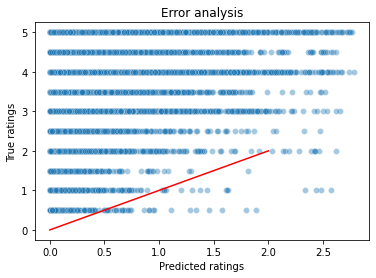

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

predictions = test_pos.pred_rating
true_values = test_pos.true_rating

plt.title('Error analysis')
plt.xlabel('Predicted ratings')
plt.ylabel('True ratings')
sns.lineplot(x=[0,2], y=[0,2], color='red')
sns.scatterplot(x=predictions, y=true_values, alpha=0.4)
plt.show()

In [ ]:
test_pos.loc[test_pos.true_rating==2,:]["pred_rating"].mean()

0.3271610772467777

In [ ]:
test_pos.loc[test_pos.true_rating==1,:]["pred_rating"].mean()

0.2816322012365369

In [ ]:
from sklearn.metrics import r2_score

r2_score(test_pos.true_rating, test_pos.pred_rating)

-8.263389365140958